In [128]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandasql import sqldf 
pysql = lambda q: sqldf(q, globals())
from top2vec import Top2Vec

In [2]:
raw_data = pd.read_csv("Assignment.csv")
raw_data.head(50)

,Month,Dealer,LOB,Car_Model,Emplyee_Code,Status,Reason_Lost,Testdrive,Financier,Source(PV),Inquiry_Date,Booking_Date,Invoice_Date,Booking_Confirmed,Sale_Confirmed
0,2020 / 01,Dealer 1,Cars,Model A,2.830000e+18,Lost,Unspecified,Not given,SELF,External Leads - Data Farming,02-01-2020,NaN,NaN,No,No
1,2020 / 01,Dealer 1,Cars,Model A,2.830000e+18,Lost,Unspecified,Not given,SELF,External Leads - Data Farming,13-01-2020,NaN,NaN,No,No
2,2020 / 01,Dealer 1,Cars,Model A,2.830000e+18,Lost,Unspecified,Not given,SELF,External Leads - Data Farming,03-01-2020,NaN,NaN,No,No
3,2020 / 01,Dealer 1,Cars,Model A,2.490000e+18,Lost,Unspecified,Not given,SELF,External Leads - Data Farming,12-01-2020,NaN,NaN,No,No
4,2020 / 01,Dealer 1,Cars,Model A,5.530000e+18,Lost,Unspecified,Not given,Unspecified,Showroom Walk-in,09-01-2020,NaN,NaN,No,No
5,2020 / 01,Dealer 1,Cars,Model A,5.530000e+18,Lost,Unspecified,Declined,Unspecified,Call to Dealer,19-01-2020,NaN,NaN,No,No
6,2020 / 01,Dealer 1,Cars,Model A,5.530000e+18,Lost,Unspecified,Given,Unspecified,Cold Calling,23-01-2020,NaN,NaN,No,No
7,2020 / 01,Dealer 1,Cars,Model A,1.220000e+18,Open,Unspecified,Not given,Unspecified,Call to Dealer,30-01-2020,NaN,NaN,No,No
8,2020 / 01,Dealer 1,Cars,Model A,1.220000e+18,Open,Unspecified,Not given,Unspecified,Call to Dealer,30-01-2020,NaN,NaN,No,No
9,2020 / 01,Dealer 1,Cars,Model A,1.220000e+18,Open,Unspecified,Not given,Unspecified,Call to Dealer,30-01-2020,NaN,NaN,No,No


### Making sure data is clean and understanding types of values for each column

In [3]:
print(raw_data.Month.unique())

['2020 / 01' '2020 / 02' '2020 / 03' '2020 / 04' '2020 / 05' '2020 / 06'
 '2020 / 07' '2020 / 08' '2020 / 09' '2020 / 10' '2020 / 11' '2020 / 12'
 '2021 / 01' '2021 / 02' '2021 / 03' '2021 / 04' '2021 / 05' '2021 / 06'
 '2021 / 07' '2021 / 08' '2021 / 09' '2021 / 10' '2021 / 11' '2021 / 12'
 '2022 / 01' '2022 / 02' '2022 / 03' '2022 / 04' '2022 / 05' '2022 / 06']


In [4]:
print(raw_data.LOB.unique())

['Cars' 'UVs' 'EVBU' 'Small Cars' 'Unspecified']


In [5]:
print(raw_data.Dealer.unique())

['Dealer 1' 'Dealer 2' 'Dealer 5' 'Dealer 4' 'Dealer 3']


In [6]:
print(raw_data.Car_Model.unique())

['Model A' 'Model O' 'Model P' 'Model F' 'Model I' 'Model U' 'Model J'
 'Model Q' 'Model H' 'Model D' 'Model G' 'Model S' 'Model E' 'Model C'
 'Model B' 'Model N' 'Model M' 'Model R' 'Model L' 'Model T' 'Model K']


In [7]:
print(raw_data.Status.unique())

['Lost' 'Open' 'Won']


In [8]:
print(raw_data.Reason_Lost.unique())

['Unspecified' 'Family issue' 'wife%27s choise' ... 'purchased EV' 'don'
 'due to discount']


In [9]:
print(raw_data.Testdrive.unique())

['Not given' 'Declined' 'Given']


In [10]:
print(raw_data.Financier.unique())

['SELF' 'Unspecified' 'BANK OF BARODA' 'HDFC BANK LTD' 'KVB'
 'AXIS BANK LTD' 'JANATA SAHAKARI BANK' 'ICICI BANK LTD'
 'SELF STYLE FINANCE CORPORATION' 'BAJAJ AUTO FINANCE LTD' 'IKF FINANCE'
 'COOPERATIVE BANK' 'KOTAK MAHINDRA BANK LTD' 'AXIS BANK' 'OTHERS'
 ' STATE BANK OF INDIA' 'BANK OF MAHARASHTRA' 'INDUSIND BANK LIMITED'
 'CENTRAL BANK OF INDIA' 'TATA CAPITAL FINANCIAL SERVICES LTD'
 'UNION BANK OF INDIA' 'IDBI BANK' 'CANARA BANK' 'YES BANK LTD'
 'DEVELOPMENT CREDIT BANK LIMITED' 'STATE BANK OF INDIA'
 'MAHARASHTRA STATE CO-OPERATIVE BANK' 'PUNJAB NATIONAL BANK'
 'BANK OF INDIA' 'DOMBIVALI NAGARI SAHAKARI BANK LTD' 'BAJAJ FINANCE LTD'
 'INDIAN BANK' 'BASSEIN CATHOLIC CO-OPERATIVE BANK LTD.'
 'STANDARD CHARTERED BANK' 'SATARA SAHAKARI BANK LTD.'
 'RAJGURUNAGAR SAHAKARI BANK' 'INDIAN OVERSEAS BANK'
 'BHARAT CO-OPERATIVE BANK' "SARSA PEOPLE'S CO-OPERATIVE BANK"
 'LIFE INSURANCE CORPORATION OF INDIA'
 'PANCHSHEEL MERCANTILE CO-OPERATIVE BANK' 'HARYANA S I D C'
 'NATIONAL CO-OPERATIVE 

In [11]:
print(raw_data["Source(PV)"].unique())

['External Leads - Data Farming' 'Showroom Walk-in' 'Call to Dealer'
 'Cold Calling' 'External Leads-Tollfree' 'External Leads-Web'
 'External Leads - Micro Segment' 'Priority Test Drive Program'
 'Digital Lead-Dealer' 'Events' 'Referral' 'External Leads - SSS Self'
 'External Leads-BAP' 'Workshop' 'DMA/DSA/Financier'
 ' External Leads - Data Farming' 'TMA Lead' 'External Leads- Toll Free'
 'External Leads-CAP Web' 'External Leads-SMS'
 'External Leads-Missed Call' 'External Leads-Chat' 'Web-Booking'
 'External Leads-Auto Portals' 'External Leads-CAP Workshop'
 'Subscription Lead' 'External Leads-Dealer Website' 'Subscription Sale'
 'VLE Purchase Scheme' 'External Leads-Float' 'Mechanic-TGM_PV'
 'Subscription Transfer' ' Mechanic-TGM_PV' 'Unspecified'
 'Call Centre_Prospects' ' External Leads-CAP Web'
 'External Leads-CAP Call Center' 'Digital-Facebook-Lead'
 'Digital-Website' 'External Leads-Call Center'
 ' External Leads - SSS Self' 'Anubhav' ' External Leads-BAP'
 ' Sarpanch-TGM_PV'

In [12]:
print(raw_data.Booking_Confirmed.unique())

['No' 'Yes']


In [13]:
print(raw_data.Sale_Confirmed.unique())

['No' 'Yes']


### Analyzing Data and answering Problem Statements

#### Months with the highest inquiry

In [14]:
df_high_inquiry = raw_data[["Month","Inquiry_Date"]]
df_high_inquiry = df_high_inquiry.query("Inquiry_Date != 'NULL'")
len(df_high_inquiry)

38423

In [15]:
df_high_inquiry.head(5)

,Month,Inquiry_Date
0,2020 / 01,02-01-2020
1,2020 / 01,13-01-2020
2,2020 / 01,03-01-2020
3,2020 / 01,12-01-2020
4,2020 / 01,09-01-2020


Text(0, 0.5, 'Inquiry Count')

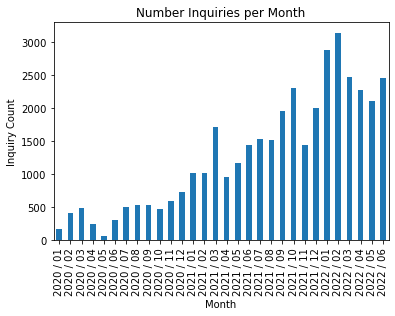

In [16]:
df_high_inquiry_viz = df_high_inquiry.groupby("Month").size()
df_high_inquiry_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Number Inquiries per Month")
plt.xlabel("Month")
plt.ylabel("Inquiry Count")

#### 2022/02 or Feb 2022 month has the highest inquiries

#### Months with the highest booking

In [17]:
df_high_booking = raw_data[["Month","Booking_Confirmed"]]
df_high_booking = df_high_booking.query('Booking_Confirmed == "Yes"')
len(df_high_booking)

8861

Text(0, 0.5, 'Booking Confirmed Count')

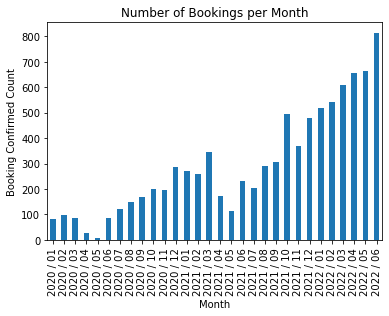

In [18]:
df_high_booking_viz = df_high_booking.groupby("Month").size()
df_high_booking_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Number of Bookings per Month")
plt.xlabel("Month")
plt.ylabel("Booking Confirmed Count")

#### 2022/06 or June 2022 month has the highest confirmed bookings

#### Months with the highest sale

In [19]:
df_high_sale = raw_data[["Month","Sale_Confirmed"]]
df_high_sale = df_high_sale.query('Sale_Confirmed == "Yes"')
len(df_high_sale)

5368

Text(0, 0.5, 'Sale Confirmed Count')

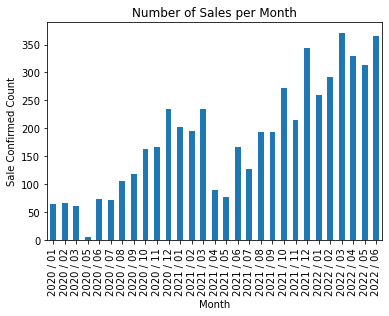

In [20]:
df_high_sale_viz = df_high_sale.groupby("Month").size()
df_high_sale_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Number of Sales per Month")
plt.xlabel("Month")
plt.ylabel("Sale Confirmed Count")

#### 2022/03 or March 2022 month has the highest sales

#### We can see, that the number of inquiry, booking and sales were low during the height of the pandemic. And as time moved on, the numbers rose.

#### Cars with highest % of booking after test drive

In [32]:
df_highest_booked = raw_data[['Car_Model','Testdrive','Booking_Confirmed']]
df_highest_booked = df_highest_booked.query('Testdrive == "Given"')
df_highest_booked = df_highest_booked.query('Booking_Confirmed == "Yes"')
len(df_highest_booked)

6712

Text(0, 0.5, 'Count Sold')

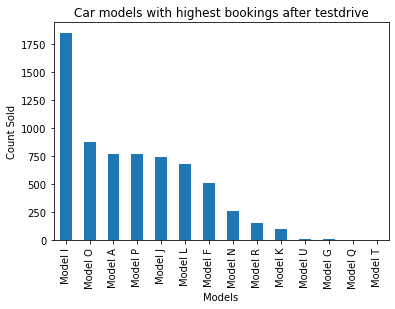

In [33]:
df_highest_booked_viz = df_highest_booked.groupby("Car_Model").size().nlargest(len(df_highest_booked))
df_highest_booked_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Car models with highest bookings after testdrive")
plt.xlabel("Models")
plt.ylabel("Count Sold")

In [34]:
print(len(df_highest_booked.query("Car_Model =='Model Q'")))

2


In [35]:
print(len(df_highest_booked.query("Car_Model =='Model T'")))

1


In [36]:
print(len(df_highest_booked.query("Car_Model =='Model U'")))

12


In [37]:
print(len(df_highest_booked.query("Car_Model =='Model G'")))

7


In [38]:
print((len(df_highest_booked.query("Car_Model =='Model I'"))/len(df_highest_booked))*100,"%")

27.532777115613825 %


#### Model I is the highest booked vehicle after test drive. It amounts to 27.53% of booked vehicles after test drive

#### Best Selling Car

In [39]:
df_best_selling = raw_data[['Car_Model','Sale_Confirmed']]
df_best_selling = df_best_selling.query("Sale_Confirmed == 'Yes'")
len(df_best_selling)

5368

Text(0, 0.5, 'Count Sold')

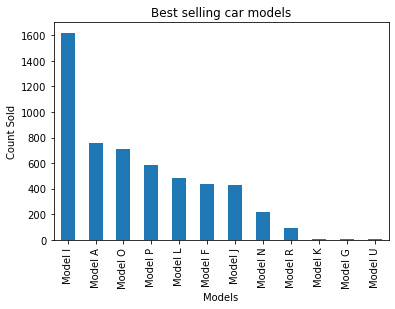

In [40]:
df_best_selling_viz = df_best_selling.groupby("Car_Model").size().nlargest(len(df_best_selling))
df_best_selling_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Best selling car models")
plt.xlabel("Models")
plt.ylabel("Count Sold")

#### Best selling car model is Model I.

#### Metrics across pipeline ( Inquiry - Invoice Confirmation)

#### Total Inquiries

In [41]:
df_total_inquiries = raw_data[['Inquiry_Date']]
df_total_inquiries = df_total_inquiries.dropna()
print(len(df_total_inquiries))
total_inquiries = len(df_total_inquiries)

38423


#### Total Bookings

In [42]:
df_total_bookings = raw_data[['Booking_Confirmed']]
df_total_bookings = df_total_bookings.query('Booking_Confirmed =="Yes"')
print(len(df_total_bookings))
total_bookings = len(df_total_bookings)

8861


#### Total Test Drives Given

In [43]:
df_total_testdrives_given = raw_data[['Testdrive']]
df_total_testdrives_given = df_total_testdrives_given.query('Testdrive =="Given"')
print(len(df_total_testdrives_given))
total_testdrives_given = len(df_total_testdrives_given)

25321


#### Total Test Drives Declined

In [44]:
df_total_testdrives_declined = raw_data[['Testdrive']]
df_total_testdrives_declined = df_total_testdrives_declined.query('Testdrive =="Declined"')
print(len(df_total_testdrives_declined))
total_testdrives_declined = len(df_total_testdrives_declined)

43


#### Total Test Drives Not Given

In [45]:
df_total_testdrives_ngiven = raw_data[['Testdrive']]
df_total_testdrives_ngiven = df_total_testdrives_ngiven.query('Testdrive =="Not given"')
print(len(df_total_testdrives_ngiven))
total_testdrives_ngiven = len(df_total_testdrives_ngiven)

13059


#### Total Sales

In [46]:
df_total_sales = raw_data[['Sale_Confirmed']]
df_total_sales = df_total_sales.query('Sale_Confirmed =="Yes"')
print(len(df_total_sales))
total_sales = len(df_total_sales)

5368


#### Final Metrics

In [47]:
metric_data =[{'inquiries':total_inquiries,'testdrives (given)':total_testdrives_given,'testdrives (not given)':total_testdrives_ngiven,'testdrives (declined)':total_testdrives_declined,'bookings':total_bookings,'sales':total_sales}]
city_metrics = pd.DataFrame(metric_data,index=['totals'])
city_metrics.head()

,inquiries,testdrives (given),testdrives (not given),testdrives (declined),bookings,sales
totals,38423,25321,13059,43,8861,5368


#### Interesting trend, even though 2/3 of the customers have had a test drive, only 23% of total customers have ended up booking a vehicle, and only 14% of total customers ended up buying the vehicle

#### Mode of Financiers

In [48]:
breakdown_financier = raw_data[['Financier']]
breakdown_financier = breakdown_financier.query('Financier != "Unspecified"')
print(len(breakdown_financier))

16397


In [49]:
breakdown_financier = breakdown_financier.query('Financier != "SELF"')
print(len(breakdown_financier))

2334


Text(0, 0.5, 'Count')

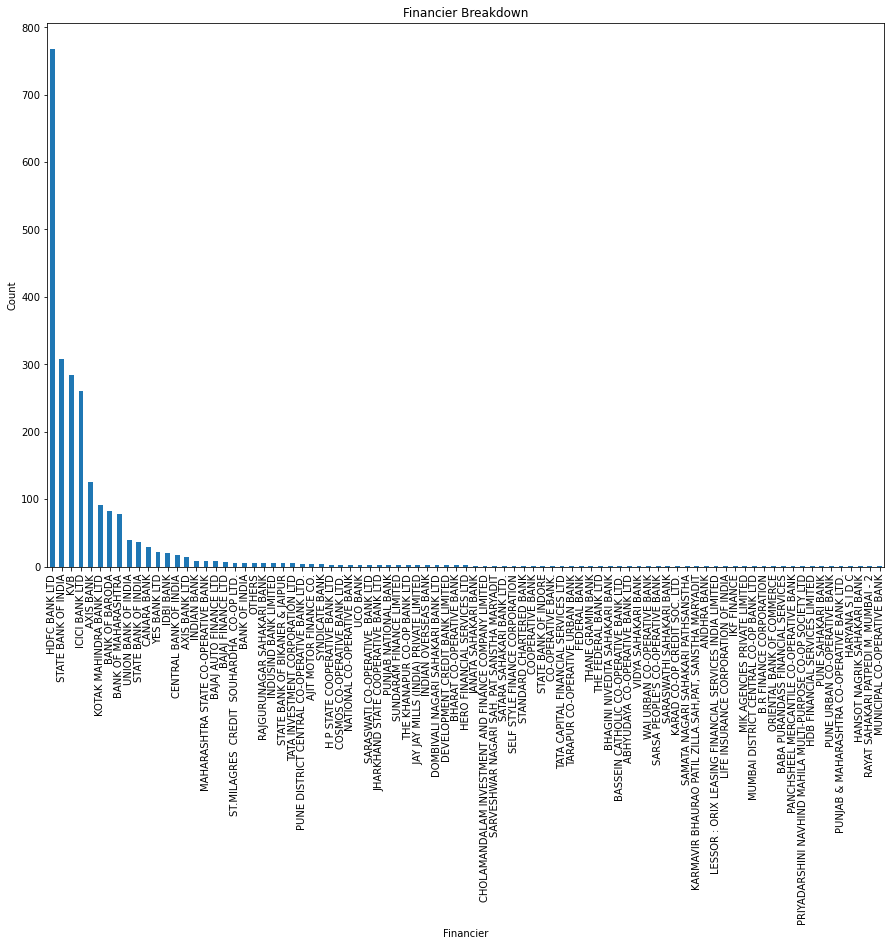

In [51]:
break_down_financier_viz = breakdown_financier.groupby("Financier").size().nlargest(len(breakdown_financier))
plt.figure(figsize=(15,10))
break_down_financier_viz.plot(kind='bar')
plt.xticks(rotation=90, horizontalalignment="center")
plt.title("Financier Breakdown")
plt.xlabel("Financier")
plt.ylabel("Count")

In [52]:
financier_unspecified = (len(raw_data)-len(raw_data.query('Financier != "Unspecified"')))
print(financier_unspecified)

22026


In [53]:
financier_self = (len(raw_data)-len(raw_data.query('Financier != "SELF"')))
print(financier_self)

14063


In [54]:
financier_top = (len(raw_data)-len(raw_data.query('Financier != "HDFC BANK LTD"')))
print(financier_top)

768


#### Keeping aside 'Unspecified' and 'Self', the top financiers mostly used are as follows (in order): HDFC BANK LTD, STATE BANK OF INDIA, KVB, ICICI BANK LTD, AXIS BANK, KOTAK MAHINDRA BANK LTD, BANK OF BARODA and BANK OF MAHARAASHTRA

#### However, as we can see, majority of the time, the customer is their own financier. 

#### Highest Performing dealers (wrt volume of inquiry and conversion)

##### First we get the metric of volume of queries/dealer

Text(0, 0.5, 'Dealer')

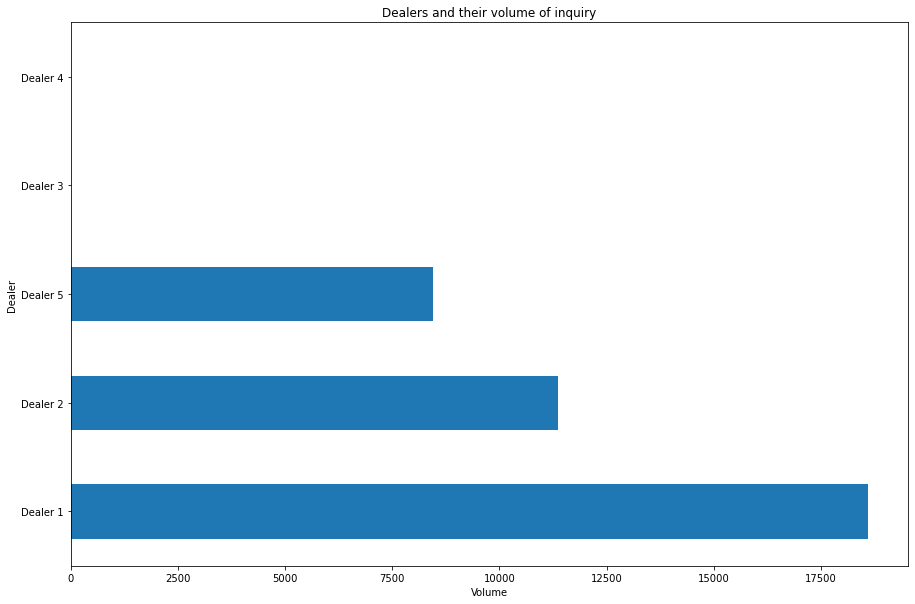

In [55]:
df_dealer_inquiry_vol = raw_data[['Dealer','Inquiry_Date']]
df_dealer_inquiry_vol = df_dealer_inquiry_vol.query('Inquiry_Date != "NULL"')
df_dealer_inquiry_vol_viz = df_dealer_inquiry_vol.groupby('Dealer').size().nlargest(len(df_dealer_inquiry_vol))
plt.figure(figsize=(15,10))
df_dealer_inquiry_vol_viz.plot(kind="barh")
plt.xticks(rotation=0, horizontalalignment="center")
plt.title("Dealers and their volume of inquiry")
plt.xlabel("Volume")
plt.ylabel("Dealer")

#### Dealer 1 has the most volume of inquiries followed by Dealer 2 and 5. Dealer 3 and 4 have each 1 inquiry

###### Then we look at the dealers who have total confimed sales

Text(0, 0.5, 'Dealer')

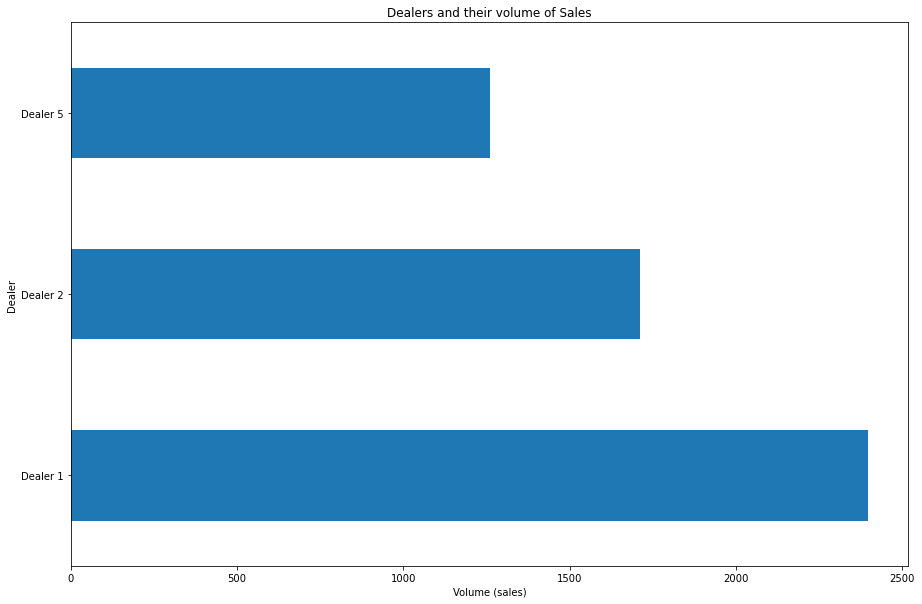

In [56]:
df_dealer_sale_vol = raw_data[['Dealer','Sale_Confirmed']]
df_dealer_sale_vol = df_dealer_sale_vol.query('Sale_Confirmed == "Yes"')
df_dealer_sale_vol_viz = df_dealer_sale_vol.groupby('Dealer').size().nlargest(len(df_dealer_sale_vol))
plt.figure(figsize=(15,10))
df_dealer_sale_vol_viz.plot(kind="barh")
plt.xticks(rotation=0, horizontalalignment="center")
plt.title("Dealers and their volume of Sales")
plt.xlabel("Volume (sales)")
plt.ylabel("Dealer")

#### Dealer 1 has the most confirmed sales.

#### To find the highest performer, we have to calculate = total sales/total inquiries

In [57]:
dealer_performance_1 = (len(df_dealer_sale_vol.query('Dealer =="Dealer 1"'))/len(df_dealer_inquiry_vol.query('Dealer == "Dealer 1"'))*100)
print("Dealer 1 % Conversion:", dealer_performance_1,"%")

Dealer 1 % Conversion: 12.889868788986881 %


In [58]:
dealer_performance_2 = (len(df_dealer_sale_vol.query('Dealer =="Dealer 2"'))/len(df_dealer_inquiry_vol.query('Dealer == "Dealer 2"'))*100)
print("Dealer 2 % Conversion:", dealer_performance_2,"%")

Dealer 2 % Conversion: 15.05584381320904 %


In [59]:
dealer_performance_3 = (len(df_dealer_sale_vol.query('Dealer =="Dealer 3"'))/len(df_dealer_inquiry_vol.query('Dealer == "Dealer 3"'))*100)
print("Dealer 3 % Conversion:", dealer_performance_3,"%")

Dealer 3 % Conversion: 0.0 %


In [60]:
dealer_performance_4 = (len(df_dealer_sale_vol.query('Dealer =="Dealer 4"'))/len(df_dealer_inquiry_vol.query('Dealer == "Dealer 4"'))*100)
print("Dealer 4 % Conversion:", dealer_performance_4,"%")

Dealer 4 % Conversion: 0.0 %


In [61]:
dealer_performance_5 = (len(df_dealer_sale_vol.query('Dealer =="Dealer 5"'))/len(df_dealer_inquiry_vol.query('Dealer == "Dealer 5"'))*100)
print("Dealer 5 % Conversion:", dealer_performance_5,"%")

Dealer 5 % Conversion: 14.892358646794419 %


In [62]:
df_dealer_performance = [{"dealer_1":dealer_performance_1,"dealer_2":dealer_performance_2,"dealer_3":dealer_performance_3,"dealer_4":dealer_performance_4,"dealer_5":dealer_performance_5}]
dealer_performance_metrics = pd.DataFrame(df_dealer_performance)
print(dealer_performance_metrics)

    dealer_1   dealer_2  dealer_3  dealer_4   dealer_5
0  12.889869  15.055844       0.0       0.0  14.892359


Text(0, 0.5, 'Performance (%)')

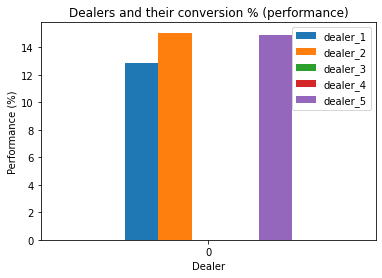

In [73]:
dealer_performance_metrics.nlargest(5,columns=['dealer_1','dealer_2','dealer_3','dealer_4','dealer_5'])
dealer_performance_metrics.plot(kind='bar')
plt.xticks(rotation=0, horizontalalignment="center")
plt.title("Dealers and their conversion % (performance)")
plt.xlabel("Dealer")
plt.ylabel("Performance (%)")

#### As we can see, Dealer 2 is the best performer, followed by Dealer 5 and 1

#### Source of Inquiry and it's improvements

Text(0.5, 0, 'Volume')

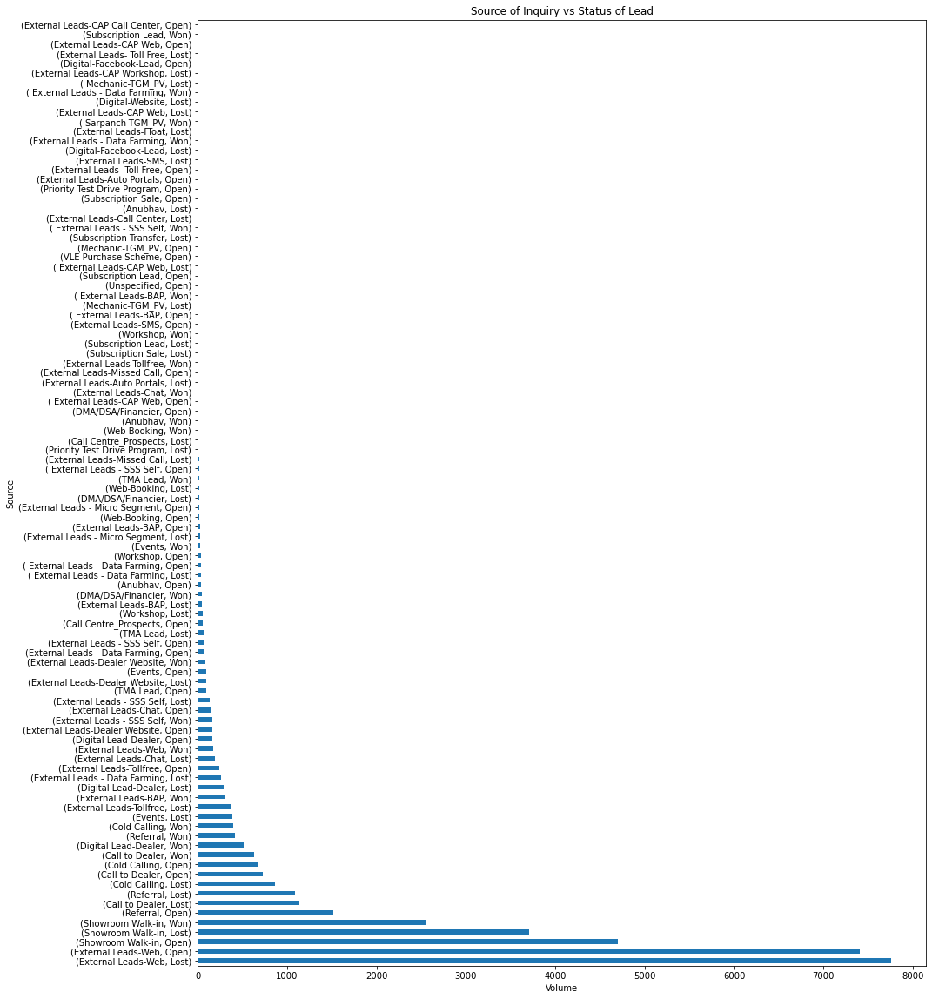

In [74]:
df_source_inquiry = raw_data[['Source(PV)','Status']]
df_source_inquiry_viz = df_source_inquiry.groupby(['Source(PV)','Status']).size().nlargest(len(df_source_inquiry))
plt.figure(figsize=(15,20))
df_source_inquiry_viz.plot(kind='barh')
plt.xticks(rotation=0, horizontalalignment="center")
plt.title("Source of Inquiry vs Status of Lead")
plt.ylabel("Source")
plt.xlabel("Volume")

#### 1. External Leads -Web generate the highest number of Leads, but the number of 'Lost' to 'Won' status is huge. This could be due to the fact that the lead has no interest in buying a car during that time of the month. Maybe it would be better to store data for 6 months as part of data privacy policy, so that within the span of 6 months, their interest could change. 
#### It could also be that the person is not interested in cars at all, in this case, we would need to filter the data to find leads which have a good potential. 


#### 2. Showroom Walkin is another prominent source, but the number of 'Lost' and 'Open' status are more than 'Won'. Improving this source method would be beneficial. Have better trained employee's handling the customer interactions. 

#### 3. Cold Calling and Calling to Dealer are the other promising source channel. Improving the sales pitch could help the stats of these methods.

#### Car Models and their performance in stores

#### Dealer 1 and the car breakdown (Sales performance)

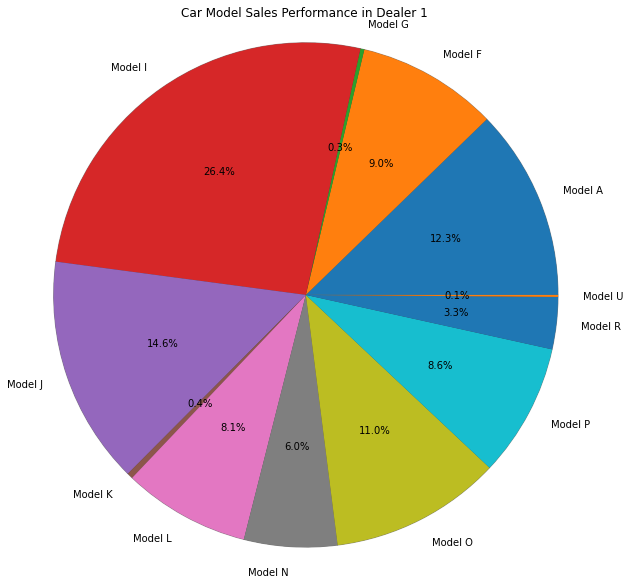

In [75]:
df_dealer_1 = raw_data[['Dealer','Car_Model','Sale_Confirmed']]
df_dealer_1 = pysql('SELECT Car_Model, COUNT(Car_Model) as Count FROM df_dealer_1 WHERE Dealer = "Dealer 1" AND Sale_Confirmed="Yes" GROUP BY Car_Model')
labels = df_dealer_1['Car_Model'].unique()
x = df_dealer_1['Count']
fig, ax1 = plt.subplots(figsize=(10, 10))
ax1.pie(x, labels = labels, autopct='%1.1f%%' , shadow=True,radius=300)
ax1.set_title('Car Model Sales Performance in Dealer 1')
ax1.axis('equal')
plt.show()

#### Dealer 2 and the car breakdown (Sales performance)

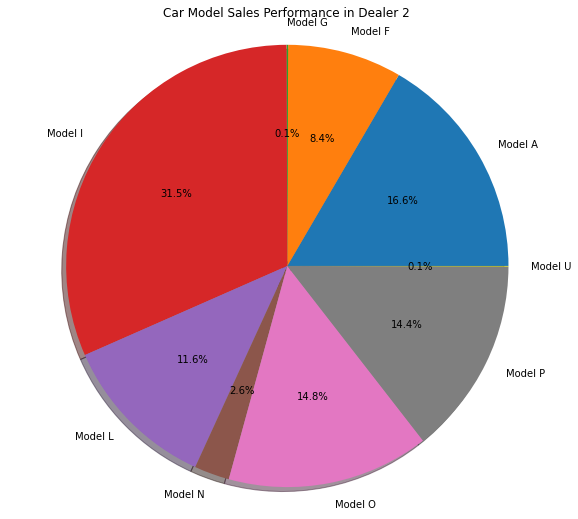

In [76]:
df_dealer_2 = raw_data[['Dealer','Car_Model','Sale_Confirmed']]
df_dealer_2 = pysql('SELECT Car_Model, COUNT(Car_Model) as Count FROM df_dealer_2 WHERE Dealer = "Dealer 2" AND Sale_Confirmed="Yes" GROUP BY Car_Model')
labels = df_dealer_2['Car_Model'].unique()
x = df_dealer_2['Count']
fig, ax2 = plt.subplots(figsize=(10, 9))
ax2.pie(x, labels = labels, autopct='%1.1f%%' , shadow=True)
ax2.set_title('Car Model Sales Performance in Dealer 2')
ax2.axis('equal')
plt.show()

#### Dealer 3 & 4 don't have any sales

#### Dealer 5 and the car breakdown (Sales performance)

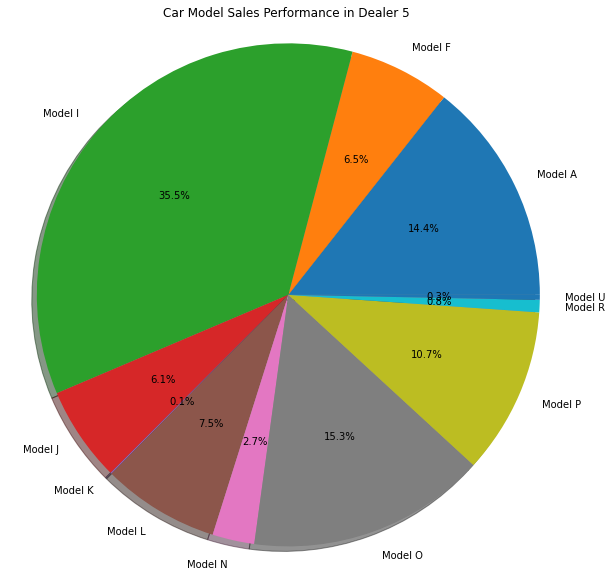

In [77]:
df_dealer_5 = raw_data[['Dealer','Car_Model','Sale_Confirmed']]
df_dealer_5 = pysql('SELECT Car_Model, COUNT(Car_Model) as Count FROM df_dealer_5 WHERE Dealer = "Dealer 5" AND Sale_Confirmed="Yes" GROUP BY Car_Model')
labels = df_dealer_5['Car_Model'].unique()
x = df_dealer_5['Count']
fig, ax1 = plt.subplots(figsize=(10, 10))
ax1.pie(x, labels = labels, autopct='%1.1f%%' , shadow=True)
ax1.set_title('Car Model Sales Performance in Dealer 5')
ax1.axis('equal')
plt.show()

#### Model I has consistently been the best performer across Dealer 1,2,5. Followed by Model A, O, J and P

#### Dealer Performance based on number of staff in house

In [78]:
df_dealer_1_performance = raw_data[['Dealer','Car_Model','Emplyee_Code','Inquiry_Date','Sale_Confirmed']]
df_dealer_1_performance = df_dealer_1_performance.query('Inquiry_Date !="NULL" and Dealer =="Dealer 1"')
df_dealer_1_staff = len(df_dealer_1_performance['Emplyee_Code'].unique())
print("Dealer 1")
print("No of staff in shop:",df_dealer_1_staff)
df_dealer_1_model = len(df_dealer_1_performance['Car_Model'].unique())
print("No of models in shop:",df_dealer_1_model)
df_dealer_1_inquiry = len(df_dealer_1_performance['Inquiry_Date'])
print("No of inquiries in shop:",df_dealer_1_inquiry)
df_dealer_1_sale = len(df_dealer_1_performance.query('Sale_Confirmed=="Yes"'))
print("No of sales in shop:",df_dealer_1_sale)
print("Sales/Staff:", round(df_dealer_1_sale/df_dealer_1_staff))

Dealer 1
No of staff in shop: 40
No of models in shop: 19
No of inquiries in shop: 18596
No of sales in shop: 2397
Sales/Staff: 60


In [79]:
df_dealer_2_performance = raw_data[['Dealer','Car_Model','Emplyee_Code','Inquiry_Date','Sale_Confirmed']]
df_dealer_2_performance = df_dealer_2_performance.query('Inquiry_Date !="NULL" and Dealer =="Dealer 2"')
df_dealer_2_staff = len(df_dealer_2_performance['Emplyee_Code'].unique())
print("Dealer 2")
print("No of staff in shop:",df_dealer_2_staff)
df_dealer_2_model = len(df_dealer_2_performance['Car_Model'].unique())
print("No of models in shop:",df_dealer_2_model)
df_dealer_2_inquiry = len(df_dealer_2_performance['Inquiry_Date'])
print("No of inquiries in shop:",df_dealer_2_inquiry)
df_dealer_2_sale = len(df_dealer_2_performance.query('Sale_Confirmed=="Yes"'))
print("No of sales in shop:",df_dealer_2_sale)
print("Sales/Staff:", round(df_dealer_2_sale/df_dealer_2_staff))

Dealer 2
No of staff in shop: 53
No of models in shop: 12
No of inquiries in shop: 11371
No of sales in shop: 1712
Sales/Staff: 32


In [80]:
df_dealer_3_performance = raw_data[['Dealer','Car_Model','Emplyee_Code','Inquiry_Date','Sale_Confirmed']]
df_dealer_3_performance = df_dealer_3_performance.query('Inquiry_Date !="NULL" and Dealer =="Dealer 3"')
df_dealer_3_staff = len(df_dealer_3_performance['Emplyee_Code'].unique())
print("Dealer 3")
print("No of staff in shop:",df_dealer_3_staff)
df_dealer_3_model = len(df_dealer_3_performance['Car_Model'].unique())
print("No of models in shop:",df_dealer_3_model)
df_dealer_3_inquiry = len(df_dealer_3_performance['Inquiry_Date'])
print("No of inquiries in shop:",df_dealer_3_inquiry)
df_dealer_3_sale = len(df_dealer_3_performance.query('Sale_Confirmed=="Yes"'))
print("No of sales in shop:",df_dealer_3_sale)
print("Sales/Staff:", round(df_dealer_3_sale/df_dealer_3_staff))

Dealer 3
No of staff in shop: 1
No of models in shop: 1
No of inquiries in shop: 1
No of sales in shop: 0
Sales/Staff: 0


In [81]:
df_dealer_4_performance = raw_data[['Dealer','Car_Model','Emplyee_Code','Inquiry_Date','Sale_Confirmed']]
df_dealer_4_performance = df_dealer_4_performance.query('Inquiry_Date !="NULL" and Dealer =="Dealer 4"')
df_dealer_4_staff = len(df_dealer_4_performance['Emplyee_Code'].unique())
print("Dealer 4")
print("No of staff in shop:",df_dealer_4_staff)
df_dealer_4_model = len(df_dealer_4_performance['Car_Model'].unique())
print("No of models in shop:",df_dealer_4_model)
df_dealer_4_inquiry = len(df_dealer_4_performance['Inquiry_Date'])
print("No of inquiries in shop:",df_dealer_4_inquiry)
df_dealer_4_sale = len(df_dealer_4_performance.query('Sale_Confirmed=="Yes"'))
print("No of sales in shop:",df_dealer_4_sale)
print("Sales/Staff:", round(df_dealer_4_sale/df_dealer_4_staff))

Dealer 4
No of staff in shop: 1
No of models in shop: 1
No of inquiries in shop: 1
No of sales in shop: 0
Sales/Staff: 0


In [82]:
df_dealer_5_performance = raw_data[['Dealer','Car_Model','Emplyee_Code','Inquiry_Date','Sale_Confirmed']]
df_dealer_5_performance = df_dealer_5_performance.query('Inquiry_Date !="NULL" and Dealer =="Dealer 5"')
df_dealer_5_staff = len(df_dealer_5_performance['Emplyee_Code'].unique())
print("Dealer 5")
print("No of staff in shop:",df_dealer_5_staff)
df_dealer_5_model = len(df_dealer_5_performance['Car_Model'].unique())
print("No of models in shop:",df_dealer_5_model)
df_dealer_5_inquiry = len(df_dealer_5_performance['Inquiry_Date'])
print("No of inquiries in shop:",df_dealer_5_inquiry)
df_dealer_5_sale = len(df_dealer_5_performance.query('Sale_Confirmed=="Yes"'))
print("No of sales in shop:",df_dealer_5_sale)
print("Sales/Staff:", round(df_dealer_5_sale/df_dealer_5_staff))

Dealer 5
No of staff in shop: 25
No of models in shop: 18
No of inquiries in shop: 8454
No of sales in shop: 1259
Sales/Staff: 50


#### Dealer 1 and 5 are performing as expected with the number of staffs they have, Dealer 2 is performing sub-par. 
#### The main metric used for this is Sales/Staff (rounded). This shows us how many cars per staff are being successfully sold. 

#### Top Performing Employees (as per their % Converted, Sales/Inquiry)

#### Dealer 1

In [114]:
df_dealer_1_employees = raw_data[['Dealer','Emplyee_Code','Inquiry_Date','Booking_Confirmed','Sale_Confirmed']]
df_dealer_1_employees = df_dealer_1_employees.query('Dealer == "Dealer 1"')
df_dealer_1_employees_1 = pysql('SELECT Emplyee_Code, COUNT(Inquiry_Date) AS Count_Inquiry FROM df_dealer_1_employees GROUP BY Emplyee_Code')
df_dealer_1_employees_2 = pysql('SELECT Emplyee_Code, COUNT(Booking_Confirmed) AS Count_Booking FROM df_dealer_1_employees WHERE Booking_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_1_employees_3 = pysql('SELECT Emplyee_Code, COUNT(Sale_Confirmed) AS Count_Sale FROM df_dealer_1_employees WHERE Sale_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_1_top_employees = pd.merge(pd.merge(df_dealer_1_employees_1,df_dealer_1_employees_2,on="Emplyee_Code",how="left"),df_dealer_1_employees_3,on="Emplyee_Code",how="left")
df_dealer_1_top_employees['Percentage_Converted'] = round((df_dealer_1_top_employees['Count_Sale']/df_dealer_1_top_employees['Count_Inquiry'])*100,2)
print("Dealer 1")
print(df_dealer_1_top_employees.query('Percentage_Converted >= 20.00').sort_values(by=['Percentage_Converted'],ascending=False,ignore_index=True))

Dealer 1
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  2.830000e+18            662          248.0       173.0   
1  6.670000e+17            669          217.0       141.0   

   Percentage_Converted  
0                 26.13  
1                 21.08  


#### Dealer 2

In [115]:
df_dealer_2_employees = raw_data[['Dealer','Emplyee_Code','Inquiry_Date','Booking_Confirmed','Sale_Confirmed']]
df_dealer_2_employees = df_dealer_2_employees.query('Dealer == "Dealer 2"')
df_dealer_2_employees_1 = pysql('SELECT Emplyee_Code, COUNT(Inquiry_Date) AS Count_Inquiry FROM df_dealer_2_employees GROUP BY Emplyee_Code')
df_dealer_2_employees_2 = pysql('SELECT Emplyee_Code, COUNT(Booking_Confirmed) AS Count_Booking FROM df_dealer_2_employees WHERE Booking_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_2_employees_3 = pysql('SELECT Emplyee_Code, COUNT(Sale_Confirmed) AS Count_Sale FROM df_dealer_2_employees WHERE Sale_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_2_top_employees = pd.merge(pd.merge(df_dealer_2_employees_1,df_dealer_2_employees_2,on="Emplyee_Code",how="left"),df_dealer_2_employees_3,on="Emplyee_Code",how="left")
df_dealer_2_top_employees['Percentage_Converted'] = round((df_dealer_2_top_employees['Count_Sale']/df_dealer_2_top_employees['Count_Inquiry'])*100,2)
print("Dealer 2")
print(df_dealer_2_top_employees.query('Percentage_Converted >= 20.00').sort_values(by=['Percentage_Converted'],ascending=False,ignore_index=True))

Dealer 2
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  8.070000e+18             10            8.0         5.0   
1  9.030000e+18              9            9.0         4.0   
2  4.220000e+18              5            5.0         2.0   
3  8.560000e+18            229          123.0        58.0   
4  3.170000e+18            513          174.0       125.0   
5  4.110000e+18            614          217.0       148.0   
6  1.030000e+18             14            5.0         3.0   

   Percentage_Converted  
0                 50.00  
1                 44.44  
2                 40.00  
3                 25.33  
4                 24.37  
5                 24.10  
6                 21.43  


#### Dealer 5

In [116]:
df_dealer_5_employees = raw_data[['Dealer','Emplyee_Code','Inquiry_Date','Booking_Confirmed','Sale_Confirmed']]
df_dealer_5_employees = df_dealer_5_employees.query('Dealer == "Dealer 5"')
df_dealer_5_employees_1 = pysql('SELECT Emplyee_Code, COUNT(Inquiry_Date) AS Count_Inquiry FROM df_dealer_5_employees GROUP BY Emplyee_Code')
df_dealer_5_employees_2 = pysql('SELECT Emplyee_Code, COUNT(Booking_Confirmed) AS Count_Booking FROM df_dealer_5_employees WHERE Booking_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_5_employees_3 = pysql('SELECT Emplyee_Code, COUNT(Sale_Confirmed) AS Count_Sale FROM df_dealer_5_employees WHERE Sale_Confirmed="Yes" GROUP BY Emplyee_Code')
df_dealer_5_top_employees = pd.merge(pd.merge(df_dealer_5_employees_1,df_dealer_5_employees_2,on="Emplyee_Code",how="left"),df_dealer_5_employees_3,on="Emplyee_Code",how="left")
df_dealer_5_top_employees['Percentage_Converted'] = round((df_dealer_5_top_employees['Count_Sale']/df_dealer_5_top_employees['Count_Inquiry'])*100,2)
print("Dealer 5")
print(df_dealer_5_top_employees.query('Percentage_Converted >= 20.00').sort_values(by=['Percentage_Converted'],ascending=False,ignore_index=True))

Dealer 5
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  1.610000e+18              2            1.0         1.0   
1  6.890000e+18            188          116.0        82.0   
2  8.901810e+15            477          242.0       180.0   
3  2.300000e+18            338          125.0        69.0   

   Percentage_Converted  
0                 50.00  
1                 43.62  
2                 37.74  
3                 20.41  


#### Poor Performing Employees (as per their % Converted, Sales/Inquiry)

#### Dealer 1

In [110]:
print("Dealer 1")
print(df_dealer_1_top_employees.query('Percentage_Converted < 10.00').sort_values(by=['Percentage_Converted'],ascending=True,ignore_index=True))

Dealer 1
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  8.760000e+18            107            7.0         3.0   
1  2.570000e+17            314           13.0        10.0   
2  8.170000e+18             48            7.0         2.0   
3  2.770000e+18            388           28.0        19.0   
4  3.280000e+17            952           97.0        58.0   
5  7.610000e+18            351           40.0        22.0   
6  8.080000e+18            339           39.0        26.0   
7  1.220000e+18           1645          187.0       139.0   
8  8.180000e+18            410           91.0        40.0   
9  4.440000e+18            484           71.0        48.0   

   Percentage_Converted  
0                  2.80  
1                  3.18  
2                  4.17  
3                  4.90  
4                  6.09  
5                  6.27  
6                  7.67  
7                  8.45  
8                  9.76  
9                  9.92  


#### Dealer 2

In [112]:
print("Dealer 2")
print(df_dealer_2_top_employees.query('Percentage_Converted < 10.00').sort_values(by=['Percentage_Converted'],ascending=True,ignore_index=True))

Dealer 2
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  2.500000e+18             90           10.0         5.0   
1  4.080000e+18            585           74.0        38.0   
2  3.570000e+18             62           10.0         5.0   
3  4.070000e+18            223           39.0        19.0   
4  8.550000e+18            346           48.0        30.0   
5  6.490000e+18            159           31.0        15.0   
6  4.190000e+18            379           61.0        36.0   

   Percentage_Converted  
0                  5.56  
1                  6.50  
2                  8.06  
3                  8.52  
4                  8.67  
5                  9.43  
6                  9.50  


#### Dealer 5

In [113]:
print("Dealer 5")
print(df_dealer_5_top_employees.query('Percentage_Converted < 10.00').sort_values(by=['Percentage_Converted'],ascending=True,ignore_index=True))

Dealer 5
   Emplyee_Code  Count_Inquiry  Count_Booking  Count_Sale  \
0  5.520000e+18            227           35.0         7.0   
1  1.590000e+18             30           11.0         1.0   
2  2.650000e+18             51            4.0         2.0   
3  6.610000e+18            244           47.0        12.0   
4  2.190000e+18            477           75.0        25.0   
5  4.280000e+18            477           76.0        25.0   
6  2.580000e+18            703          105.0        54.0   

   Percentage_Converted  
0                  3.08  
1                  3.33  
2                  3.92  
3                  4.92  
4                  5.24  
5                  5.24  
6                  7.68  


#### Since there was no cutoff provided in the assignment for when a employee is a top performer/bad performer. I took upon this myself. Performance is caluclated by % Converted
##### Performance <= 10 % = Bad Performers who need more training
##### Performance < 20% = Average Performers
##### Performance >= 20% = Top Performers

#### Topic Analysis on Reasons_Lost

##### First we will remove 'unspecified' from the column and then proceed with topical analysis.

In [117]:
df_topic_analysis = raw_data[['Reason_Lost']]
df_topic_analysis = df_topic_analysis.query('Reason_Lost !="Unspecified"')
df_topic_analysis = df_topic_analysis.reset_index(drop=True)
df_topic_analysis = df_topic_analysis['Reason_Lost'].astype(str)
documents = df_topic_analysis.values.tolist()
print(documents)

['Family issue', 'wife%27s choise', 'false equiry', 'Wrong number', 'family choise', 'family choise', 'they gave more valuation for old car', 'no need of car now', 'not in budget now', 'budget issue', 'duplicate equiry already with other C.A', 'just came to see', 'budget issue', 'budget issue', 'budget issue', 'not replying', 'not interested', 'Not interested', 'Not inrested', 'not answering calls', 'Not inrested', 'family choise', 'Finance issue', 'Not interested', 'not interested now', 'just equiry he did', 'family choise n discount', 'Plan drop', 'Budget issue', 'waiting for gravitas', 'not interested out of budget', 'No budget', 'lost due to heavy discount', 'family choise', 'invalid number given', 'civil defaulter', 'budget issue', 'not interested out of budget', 'Low budget', 'budget issue', 'budget issue', 'no planning now just equired', 'Not interested', 'Not answering', 'not answering', 'not interested', 'budget issue', 'will call and let us know medical issue', 'family choise

In [118]:
model = Top2Vec(documents, workers=4, embedding_model='universal-sentence-encoder')

2022-10-29 13:37:24,456 - top2vec - INFO - Pre-processing documents for training
C:\Users\abraa\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
2022-10-29 13:37:24,568 - top2vec - INFO - Downloading universal-sentence-encoder model
2022-10-29 13:37:35,398 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2022-10-29 13:37:37,012 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2022-10-29 13:38:08,425 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2022-10-29 13:38:08,709 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


In [119]:
model.get_num_topics()

97

In [120]:
model.topic_words

array([['cancel', 'cancelled', 'postpone', ..., 'ni', 'of', 'in'],
       ['interested', 'no', 'intrested', ..., 'cibil', 'because',
        'customer'],
       ['plan', 'planning', 'no', ..., 'interested', 'intrested', 'for'],
       ...,
       ['planning', 'plan', 'no', ..., 'interested', 'covid',
        'intrested'],
       ['problem', 'issue', 'cancelled', ..., 'used', 'planning',
        'booking'],
       ['booked', 'delivery', 'booking', ..., 'of', 'covid', 'just']],
      dtype='<U10')

#### Topics and Keywoords

In [131]:
topic_words, word_scores, topic_nums = model.get_topics(97)
for words, scores, nums in zip(topic_words, word_scores, topic_nums):
  print("Topic Number: ",nums)
  print(f"Words: {words}")
  print("\n")

Topic Number:  0
Words: ['cancel' 'cancelled' 'postpone' 'drop' 'postponed' 'booked' 'duplicate'
 'booking' 'dropped' 'cancal' 'issue' 'call' 'purchase' 'lost' 'delivery'
 'plan' 'buy' 'purchased' 'due' 'not' 'no' 'covid' 'financial' 'enquiry'
 'nan' 'budget' 'done' 'problem' 'low' 'false' 'cash' 'inquiry' 'just'
 'car' 'intrested' 'cibil' 'used' 'interested' 'now' 'the' 'planning'
 'year' 'finance' 'na' 'to' 'other' 'customer' 'ni' 'of' 'in']


Topic Number:  1
Words: ['interested' 'no' 'intrested' 'not' 'ni' 'cancelled' 'now' 'dropped'
 'nan' 'cancel' 'call' 'na' 'done' 'drop' 'enquiry' 'purchased' 'buy'
 'issue' 'booked' 'low' 'for' 'postpone' 'to' 'purchase' 'just' 'the'
 'due' 'postponed' 'lost' 'year' 'inquiry' 'duplicate' 'problem' 'of'
 'financial' 'other' 'cash' 'in' 'delivery' 'plan' 'used' 'booking'
 'finance' 'planning' 'false' 'covid' 'cancal' 'cibil' 'because'
 'customer']


Topic Number:  2
Words: ['plan' 'planning' 'no' 'not' 'drop' 'ni' 'issue' 'booked' 'na'
 'postpone

#### Wordcloud of Topics (0-19)
##### You can increase this number to 97 to get all the wordclouds. I reduced this so i can keep the notebook size < 25mb

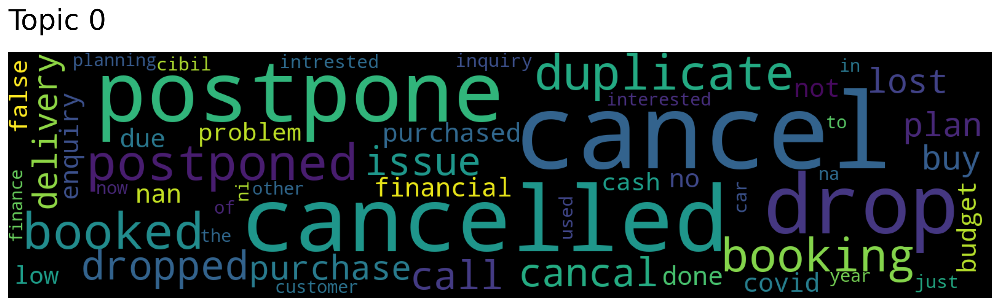

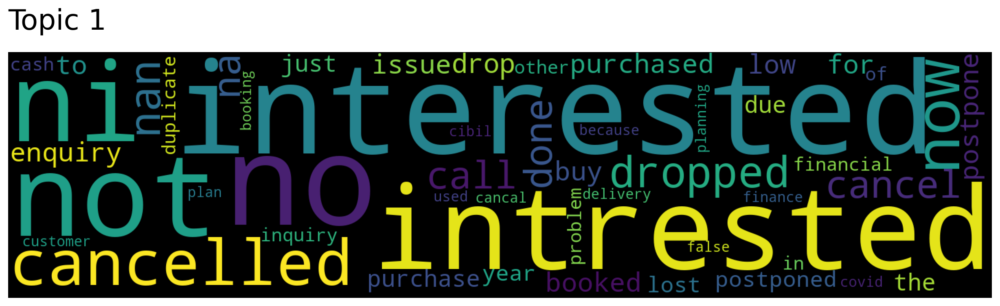

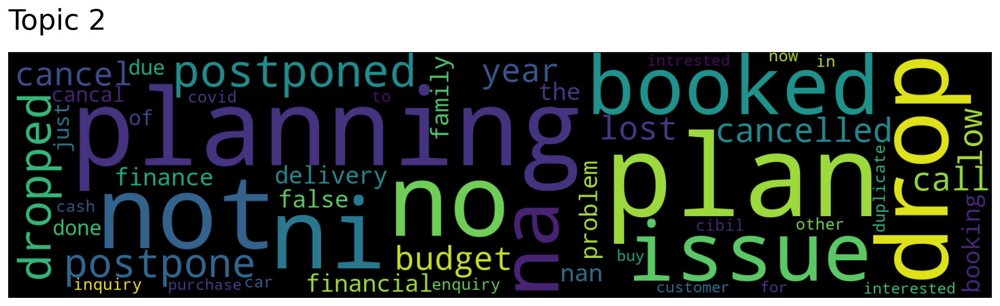

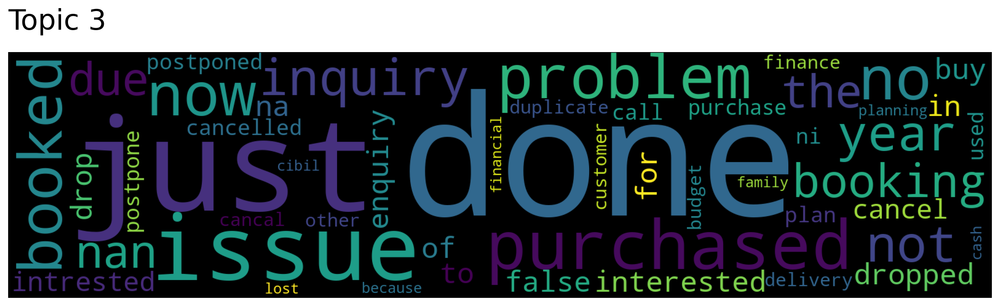

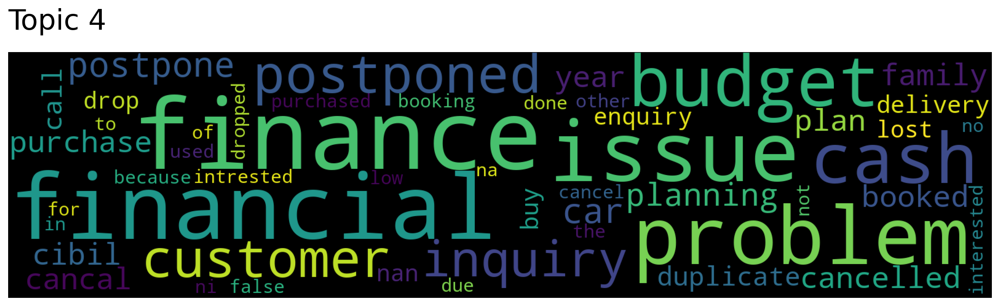

...

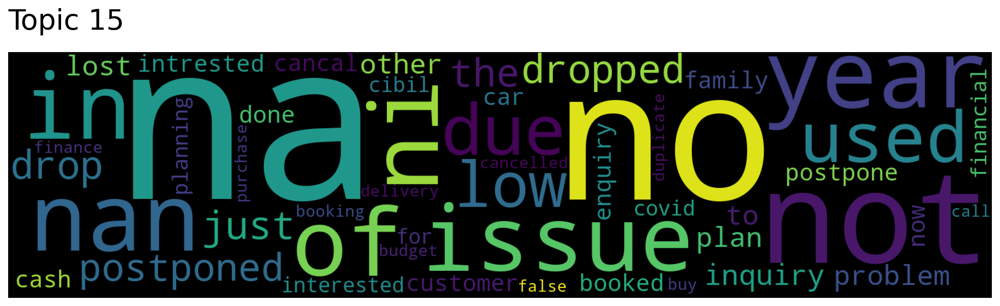

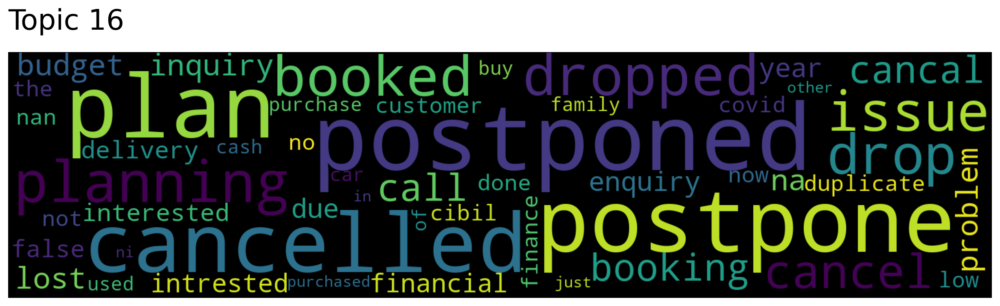

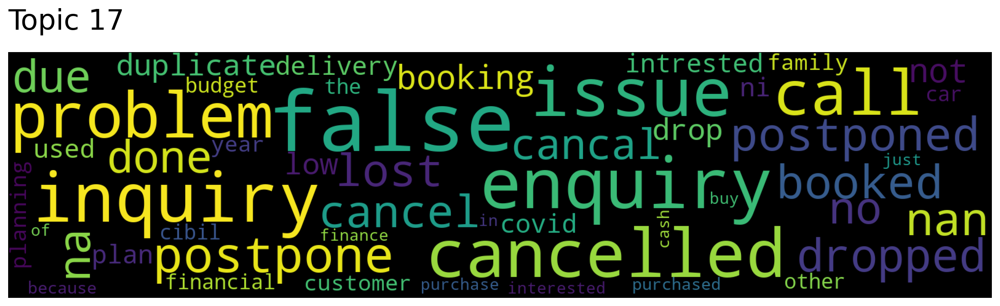

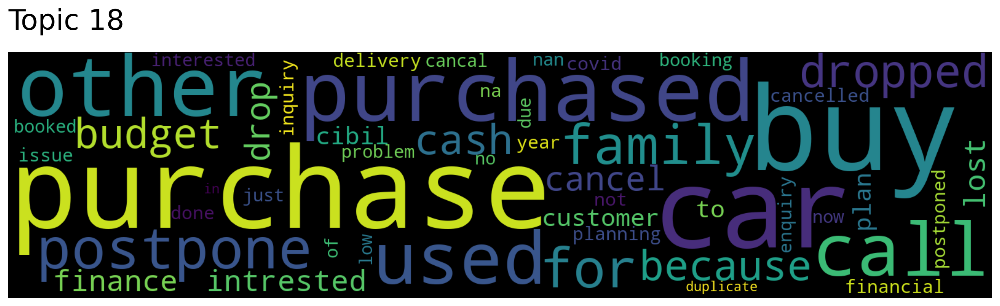

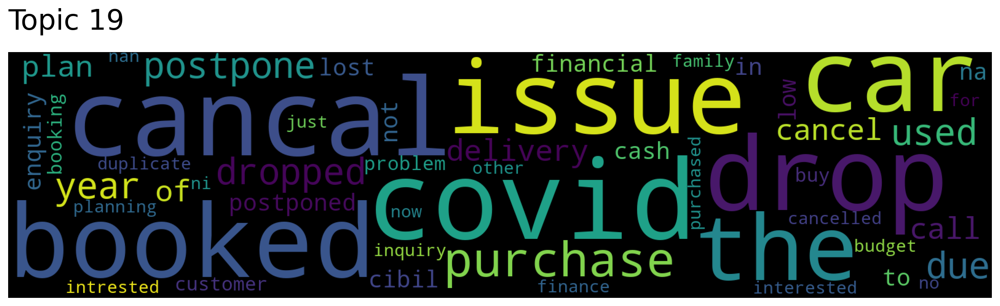

In [130]:
for i in range(20):
    model.generate_topic_wordcloud(i)

#### Similar Topics (Keywords)

In [123]:
words, word_scores = model.similar_words(keywords=["postpone"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

postponed 0.7111538854429608
cancel 0.5358928781615884
cancelled 0.47713768922832706
drop 0.46514097559178186
issue 0.4580970556460813
cancal 0.4366476868665631
dropped 0.43215469604520507
booked 0.41442807392721626
call 0.3859391475604557
inquiry 0.3813537181550904
planning 0.3682709394244057
problem 0.367071310006199
plan 0.35240662029942355
due 0.3443206012939761
enquiry 0.34169112311409255
booking 0.3300880352850724
budget 0.32515713414938
purchase 0.3245818941662705
financial 0.32391443211372617
delivery 0.3136122677618769


In [124]:
words, word_scores = model.similar_words(keywords=["postponed"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

postpone 0.711153975701005
cancelled 0.5387926389317914
dropped 0.5054035638088229
issue 0.4843715752567809
booked 0.47201508395201375
drop 0.46285522028115067
cancel 0.45438279509939294
cancal 0.4031220149584803
due 0.38545510284675477
year 0.3754055680988003
inquiry 0.36297556407533016
enquiry 0.35984336095642466
call 0.3596172321682969
booking 0.3504797416908712
problem 0.3464484864019197
na 0.33737447953855104
plan 0.33587850954932036
planning 0.33046688886640496
financial 0.33003090810487934
lost 0.3288129008912638


In [125]:
words, word_scores = model.similar_words(keywords=["covid"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

cancal 0.4535946727451819
cash 0.36031963118164934
drop 0.3598434034619765
dropped 0.3337658328058019
used 0.3246874333192108
car 0.312338710319641
lost 0.2855989455223924
postponed 0.28515004194389415
cibil 0.27807277732410085
booked 0.271611059475168
postpone 0.26918867848261174
cancel 0.26881178273089074
na 0.26067437274256844
enquiry 0.25818121873499905
family 0.2573294449534462
low 0.2562823440582259
of 0.2558639245254791
due 0.24819523748590622
plan 0.23780799178886353
other 0.2304420402559675


In [126]:
words, word_scores = model.similar_words(keywords=["interested"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

intrested 0.7216702041537117
enquiry 0.39543824878906964
for 0.3898027909000195
inquiry 0.36852077479032075
to 0.36173209711818954
call 0.33930805527940006
buy 0.32420499123756574
booked 0.3193745683396212
year 0.3171787781279758
now 0.3163598830883442
purchase 0.30159484636141853
done 0.2990697943655285
booking 0.2950912342984372
just 0.28759695308022293
of 0.28512254491932254
in 0.2763622621915161
plan 0.27632589624724824
due 0.2673507100847213
dropped 0.26435775501425685
na 0.26379057186888594


In [127]:
words, word_scores = model.similar_words(keywords=["planning"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

plan 0.7150257864008263
budget 0.4429336908821581
booked 0.4044040415226825
delivery 0.3890878542693669
inquiry 0.3852621628273216
purchase 0.38405385903616274
financial 0.38103464423215605
postpone 0.36827092051933874
booking 0.3674085274504265
due 0.36576934627250196
year 0.36049740370037486
issue 0.3560139784933821
to 0.3449316372786807
finance 0.33146233617671594
postponed 0.33046682995989307
family 0.32425486863875935
customer 0.3190966135081179
enquiry 0.3179939954648395
problem 0.3101333963379117
intrested 0.3082838174062499


#### In majority of the reasons, the leads were lost stemmed from the fact that the pandemic was at it's height. Words such as 'postpone','postponed','covid', 'cancel','dropped' indicates this.
#### Other topcis like 'budget' 'financial','issue', 'year', 'cash' were the result of the pandemic and resonate in the dataset.
#### Words such as 'due','not','to', 'interested' were found in reasons pointing to a factors the customer is facing or excuses made.

#### Top Topics (reducing the 97 topics found down to the most relevant)

In [138]:
top_topics = model.hierarchical_topic_reduction(20)

In [151]:
relevant_topic=[]
for i in range(20):
    relevant_topic.append(top_topics[i])

print(f"This list contains all the mapped topics from the above 97: {relevant_topic}")
print(len(relevant_topic))

This list contains all the mapped topics from the above 97: [[93, 22, 56, 1], [0], [13, 29, 94, 2], [11, 40, 4], [15, 20, 6], [63, 86, 36, 43, 80, 87, 5], [10, 64, 89, 23, 27, 12], [3], [46, 17, 49, 79, 45, 95, 51, 68, 70, 74, 67, 26], [14, 24, 62, 33, 81, 19], [77, 30, 32, 35, 50, 16], [21, 73, 90, 72, 9], [88, 75, 85, 37, 31, 55, 61, 38], [69, 7], [58, 41, 76, 57, 59, 83, 60], [53, 54, 66, 28, 71, 25], [48, 47, 78, 42, 39], [44, 96, 52, 92, 82, 84, 34], [8], [91, 65, 18]]
20


In [152]:
topic_keywords=[]
for i in range(20):
    topic_keywords.append(model.topic_words_reduced[i])

print(topic_keywords)

[array(['no', 'not', 'intrested', 'interested', 'ni', 'nan', 'dropped',
       'cancelled', 'na', 'cancel', 'low', 'call', 'drop', 'issue',
       'done', 'enquiry', 'booked', 'purchased', 'due', 'for', 'postpone',
       'buy', 'to', 'now', 'duplicate', 'lost', 'problem', 'purchase',
       'inquiry', 'postponed', 'just', 'year', 'the', 'of', 'other',
       'cash', 'delivery', 'financial', 'in', 'booking', 'false', 'plan',
       'used', 'planning', 'finance', 'covid', 'cancal', 'customer',
       'because', 'car'], dtype='<U10'), array(['cancel', 'cancelled', 'postpone', 'drop', 'postponed', 'booked',
       'duplicate', 'booking', 'dropped', 'cancal', 'issue', 'call',
       'purchase', 'lost', 'delivery', 'plan', 'buy', 'purchased', 'due',
       'not', 'no', 'covid', 'financial', 'enquiry', 'nan', 'budget',
       'done', 'problem', 'low', 'false', 'cash', 'inquiry', 'just',
       'car', 'intrested', 'cibil', 'interested', 'used', 'now',
       'planning', 'the', 'year', 'financ